In [1]:
import pandas as pd
import numpy as np
import math
import statistics
import scipy as sp
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

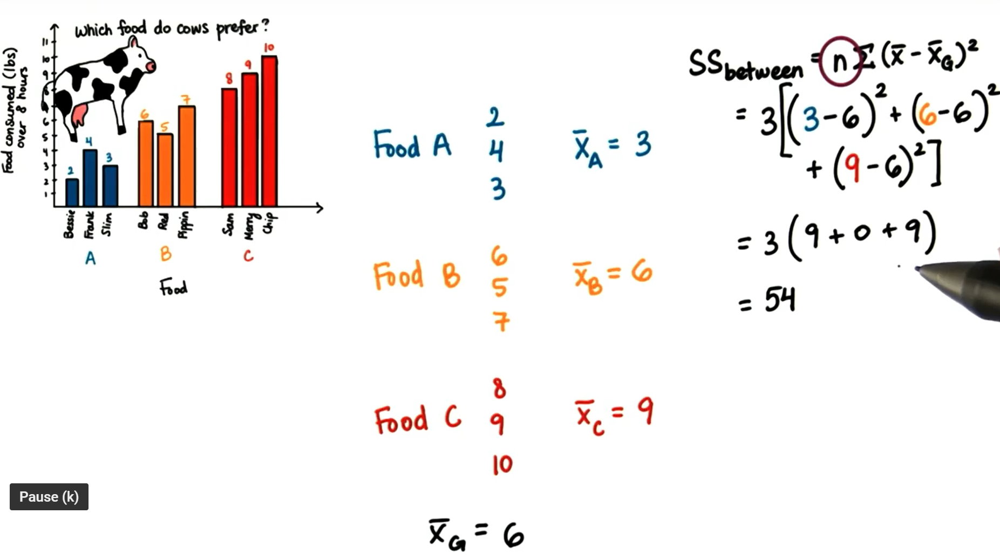

In [2]:
a=np.array([2,4,3])
b=np.array([6,5,7])
c=np.array([8,9,10])

In [3]:
gm=sum(a+b+c)/9
gm

6.0

In [4]:
xbara=sum(a)/len(a)
xbara

3.0

In [5]:
xbarb=sum(b)/len(b)
xbarb

6.0

In [6]:
xbarc=sum(c)/len(c)
xbarc

9.0

In [7]:
ssbetween =3*((xbara-gm)**2+(xbarb-gm)**2 + (xbarc-gm)**2)
ssbetween

54.0

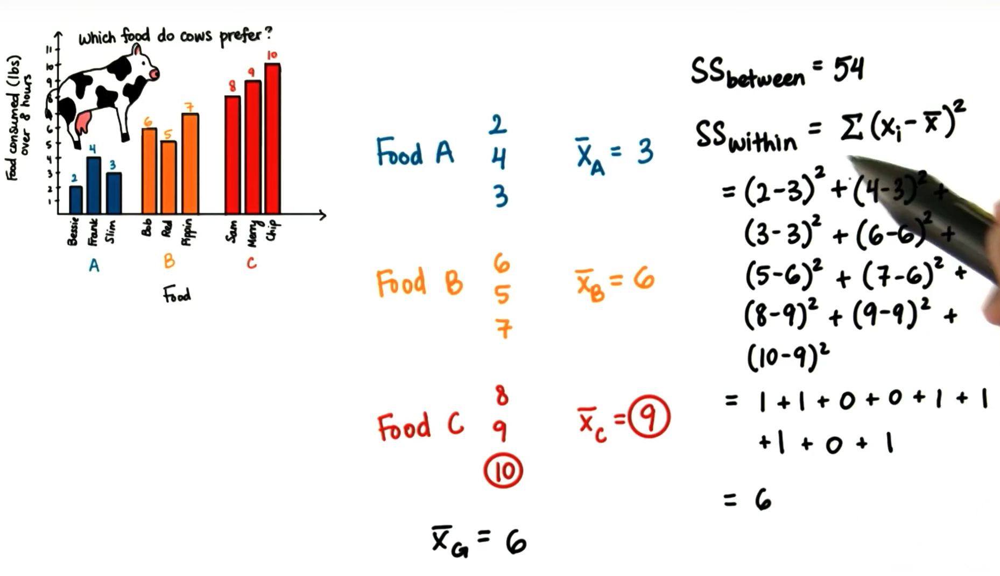

In [8]:
sswithin = sum((a-xbara)**2 + (b-xbarb)**2 + (c-xbarc)**2)
sswithin

6.0

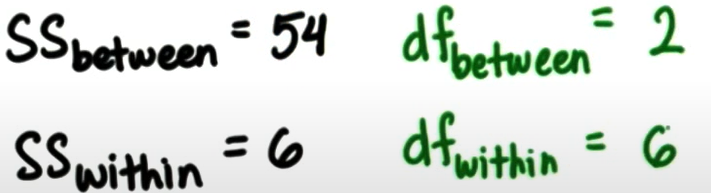

In [9]:
# k-1 :K is the number of population group
dfbetween=3-1
dfbetween

2

In [10]:
# N-k  :N is total sample size
dfwithin =9-3
dfwithin

6

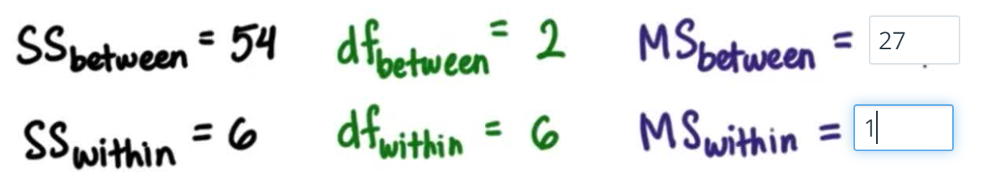

In [11]:
msbetween =ssbetween/dfbetween
msbetween

27.0

In [12]:
mswithin = sswithin/dfwithin
mswithin

1.0

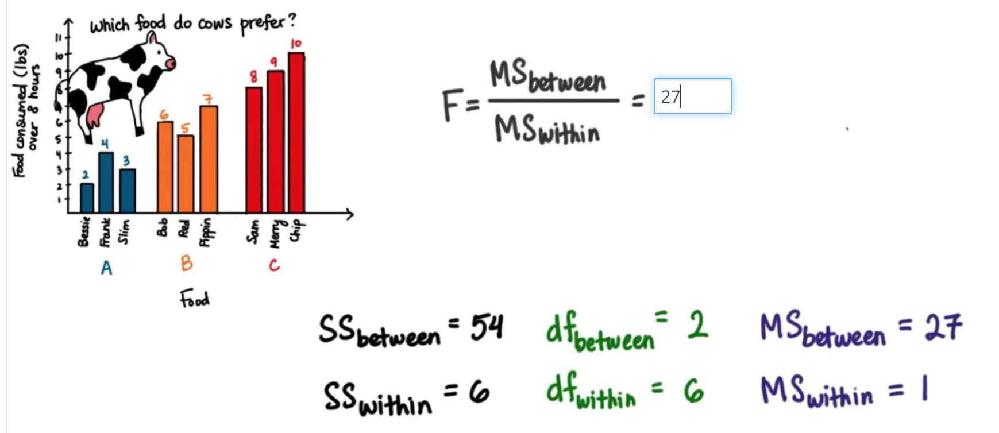

In [13]:
f_stats = msbetween/mswithin
f_stats

27.0

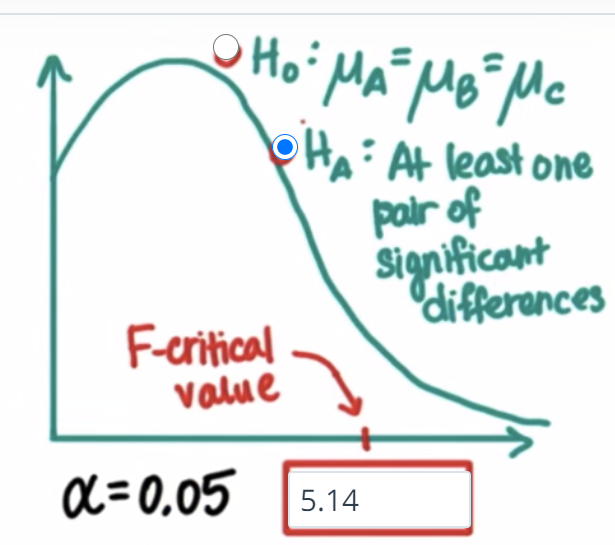

* ftable https://www.slideshare.net/gforce003/ftable

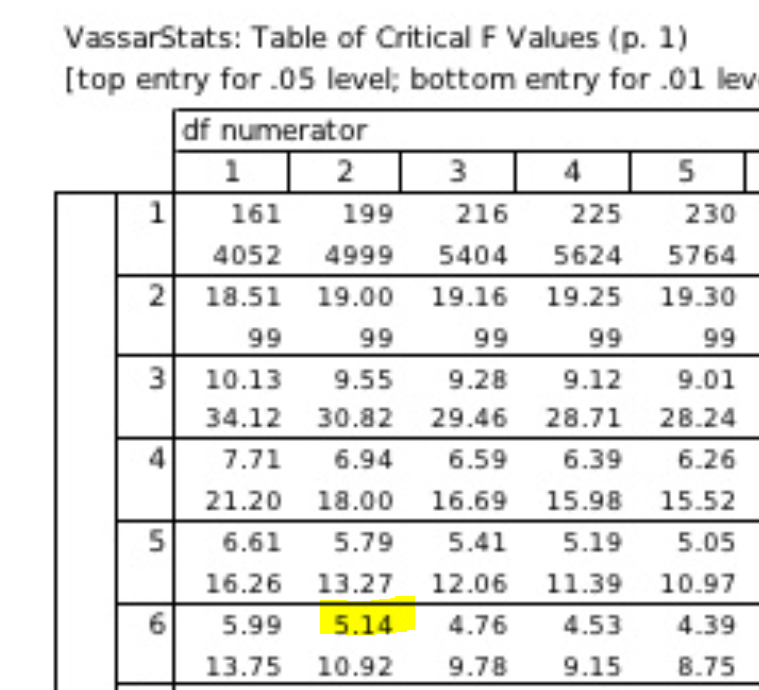

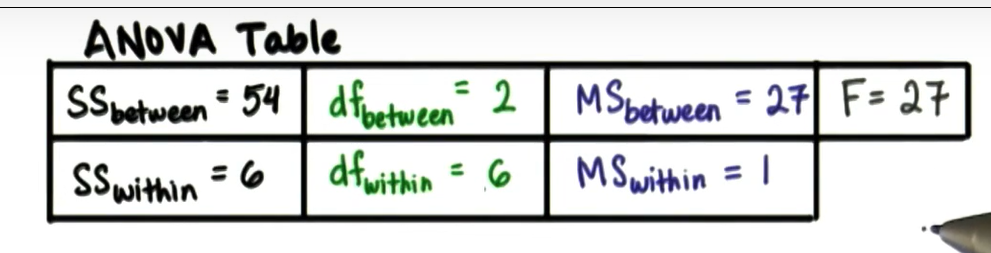

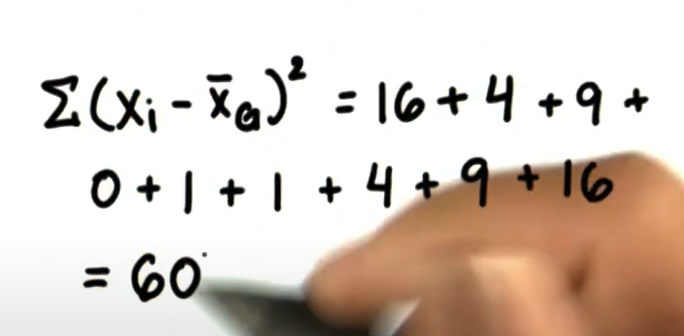

In [14]:
(a-gm)**2

array([16.,  4.,  9.])

In [15]:
(b-gm)**2

array([0., 1., 1.])

In [16]:
(c-gm)**2

array([ 4.,  9., 16.])

In [17]:
sum((a-gm)**2 + (b-gm)**2 + (c-gm)**2)

60.0

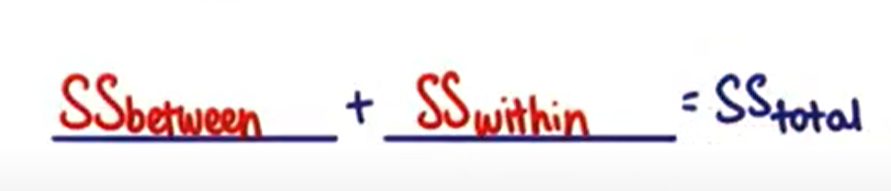

In [18]:
ssttl = ssbetween + sswithin
ssttl

60.0

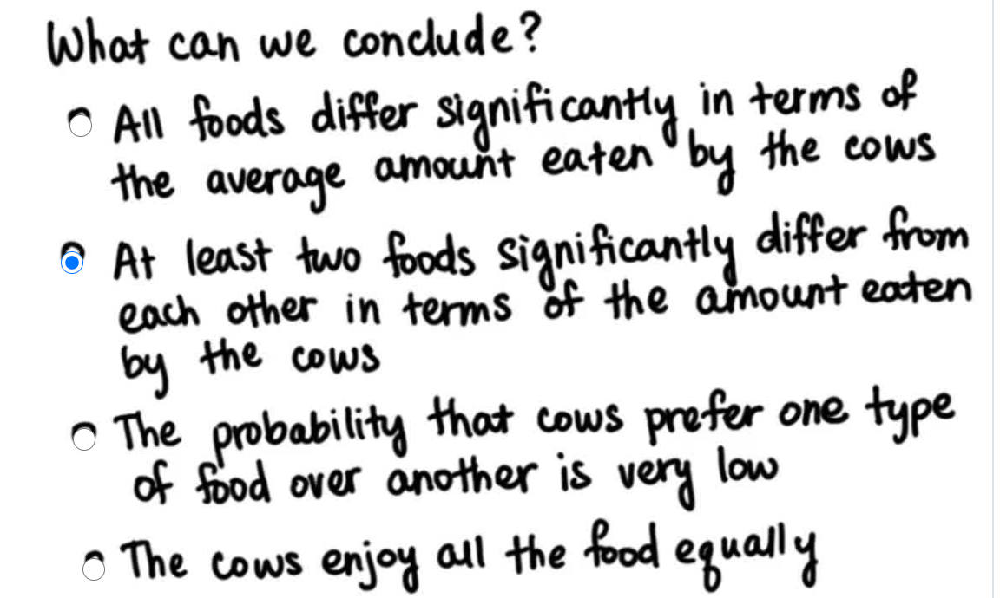

# Multiple comparison tests
# Tukey's honestly significant difference (HSD) 
# q * pooled_variance / sqrt of n 

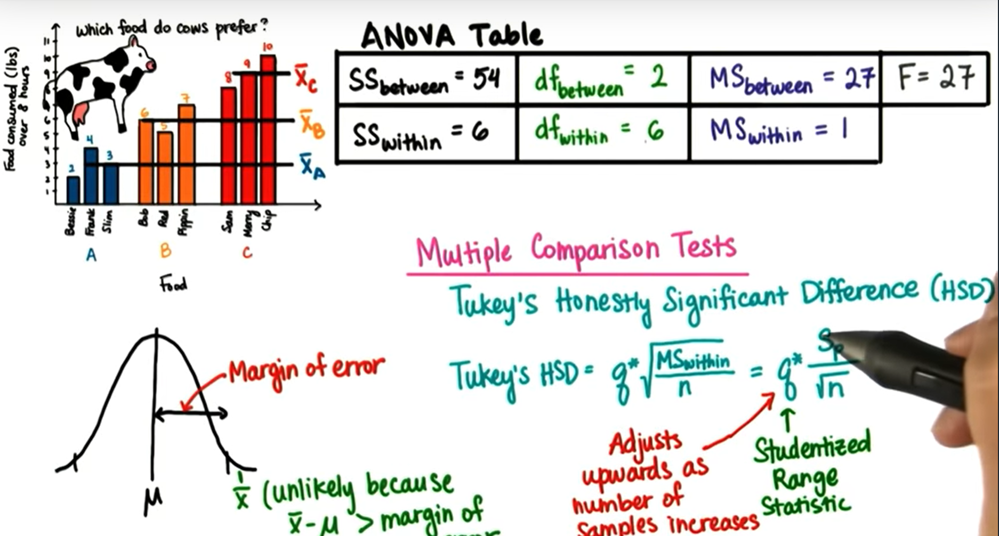

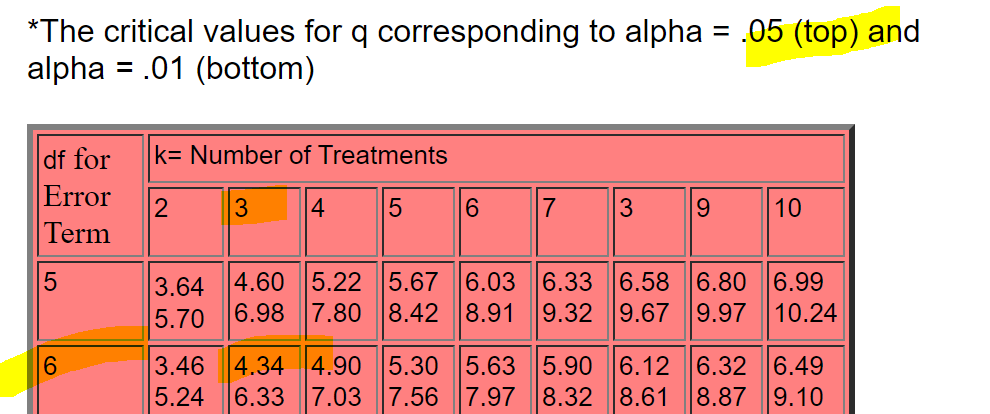

# df is the degrees of freedom for within-group variability
# k is the number of groups/samples in your study

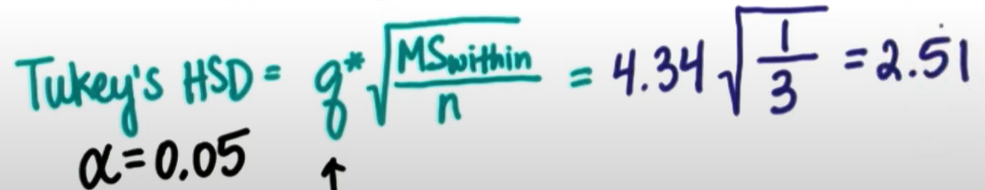

q table https://www2.stat.duke.edu/courses/Spring98/sta110c/qtable.html

In [19]:
q= 4.34
n=3

In [20]:
hsd = q*math.sqrt(mswithin/n)
hsd = np.round(hsd,decimals=2)
hsd 

2.51

# Honestly significantly different? 
# Greater than hsd(2.51) = All of te difference are honestly significantly different.


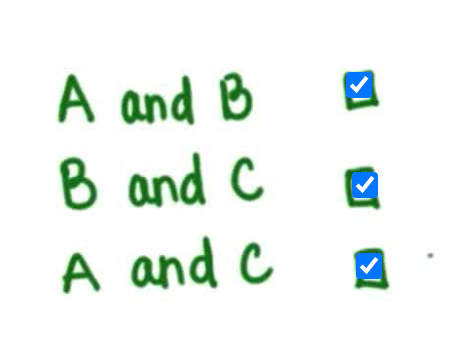

In [43]:
xbara-xbarb

-3.0

In [34]:
xbara-xbarc

-6.0

In [35]:
xbarb-xbarc

-3.0

* ab(3), ac(6), bc(3) 's mean difference is greater than hsd(2.51) = All of te difference are honestly significantly different.
* Cows prefer food C. 

### IMPORTANT! **SAMPLE SIZE** needs to be the **same** when you calcuate **HSD**.

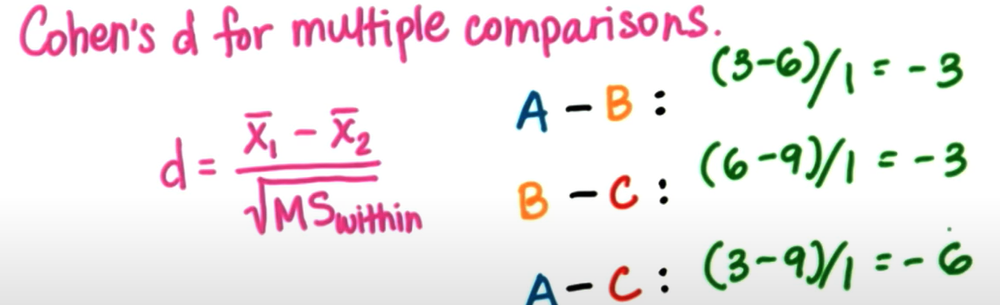

In [44]:
cohensd_ab =(xbara-xbarb)/mswithin
cohensd_ab

-3.0

In [45]:
cohensd_ac =(xbara-xbarc)/mswithin
cohensd_ac

-6.0

In [46]:
cohensd_bc =(xbarb-xbarc)/mswithin
cohensd_bc

-3.0

# η2 (Eta squared) : the propotion of variation due to group difference. 
* it is like r2 in t-test.


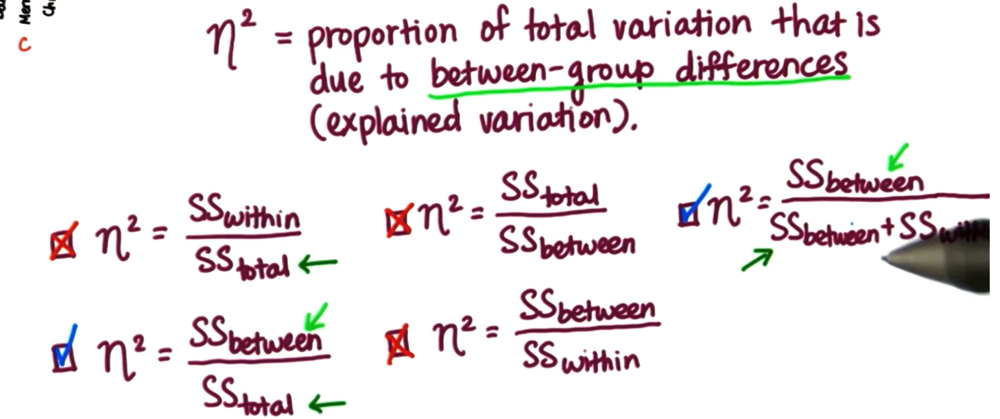

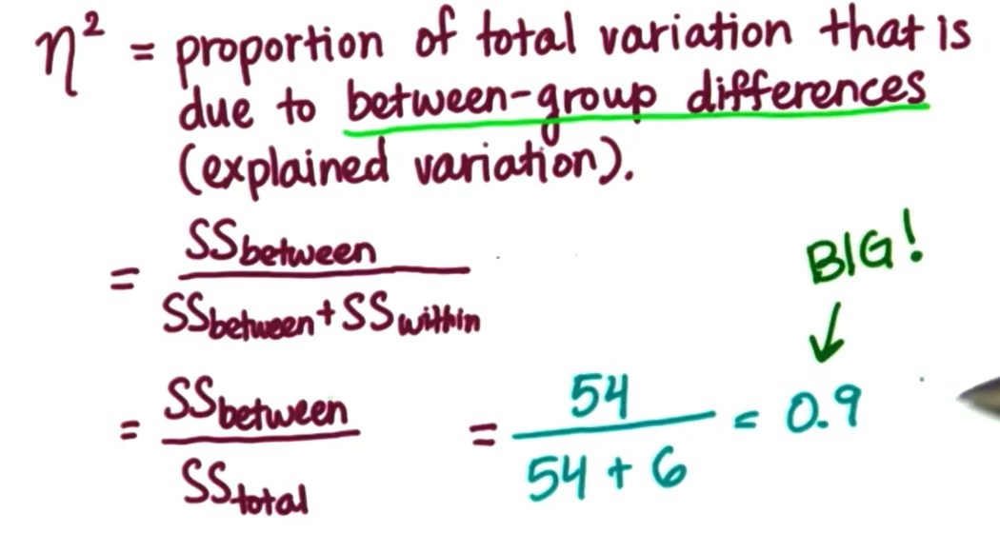

In [47]:
eta=ssbetween/ssttl
eta

0.9

* **90% of the difference in the amount eaten is due to the differences in food types.**
* the other 10% remains unexplained.
# Anything bigger than 0.14(eta) is considered as big. 
# Eta is between 0 and 1. not smaller or bigger!


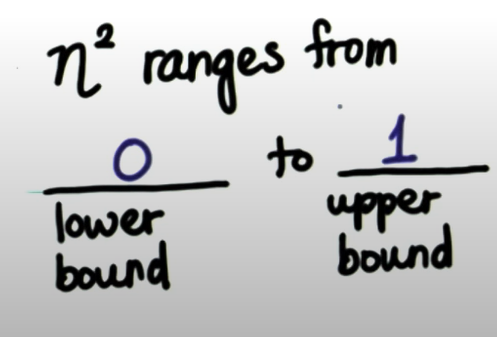

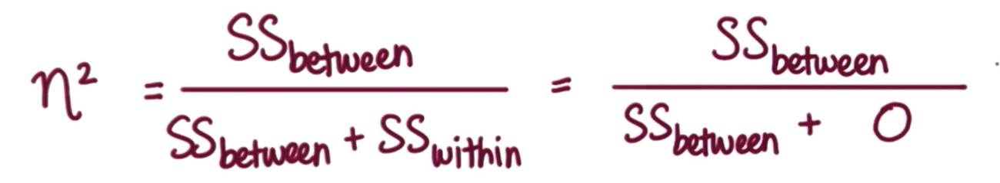

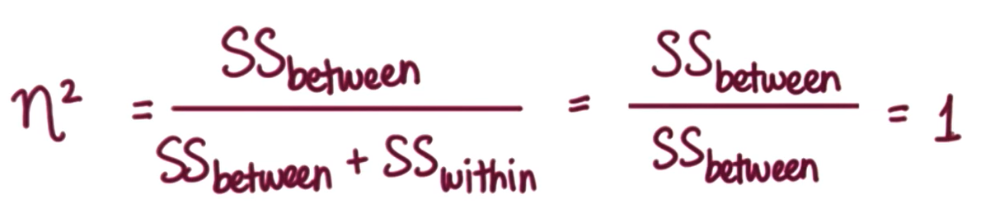

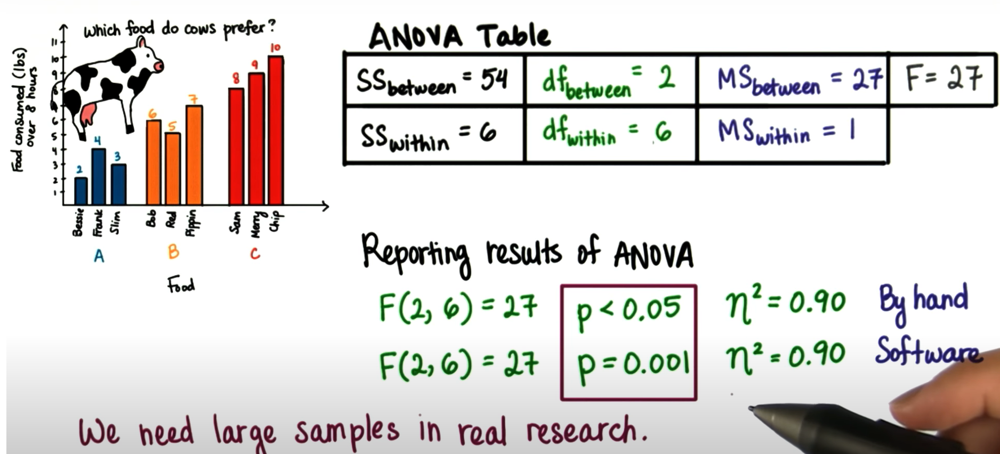

* What you need is to compare **P_value** and **alpha** level. 
* **If p_value is less than alpha, reject Ho**
* you can skip intermediate steps, like anova tale.

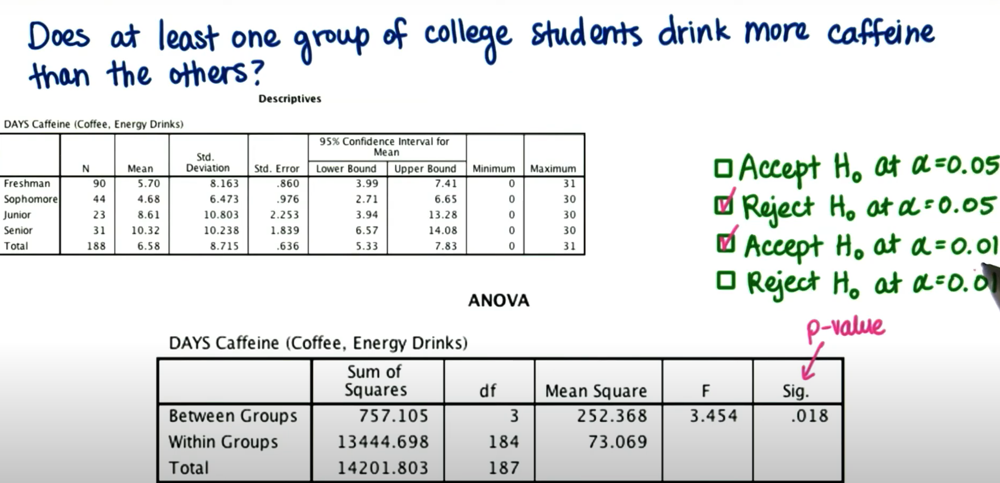

* sig = significant level = p-value
* p-value is less than 0.05 but greater than 0.01. = Reject Ho at a =0.05

#### other way to interpret the table above.
* use t-table to find t-critical value. 
* F = f-statistic
* compare f-statistic falls between them.

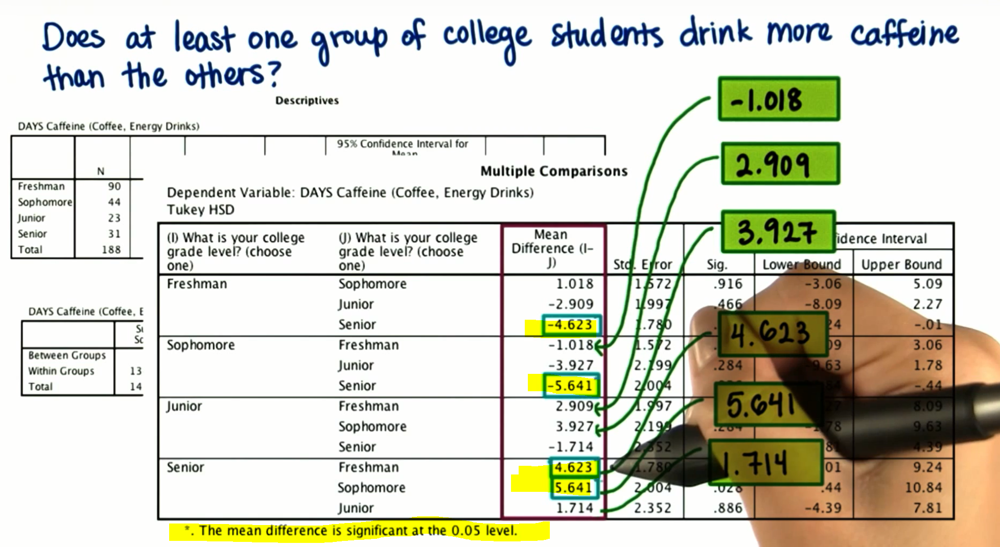

# Different sample sizes

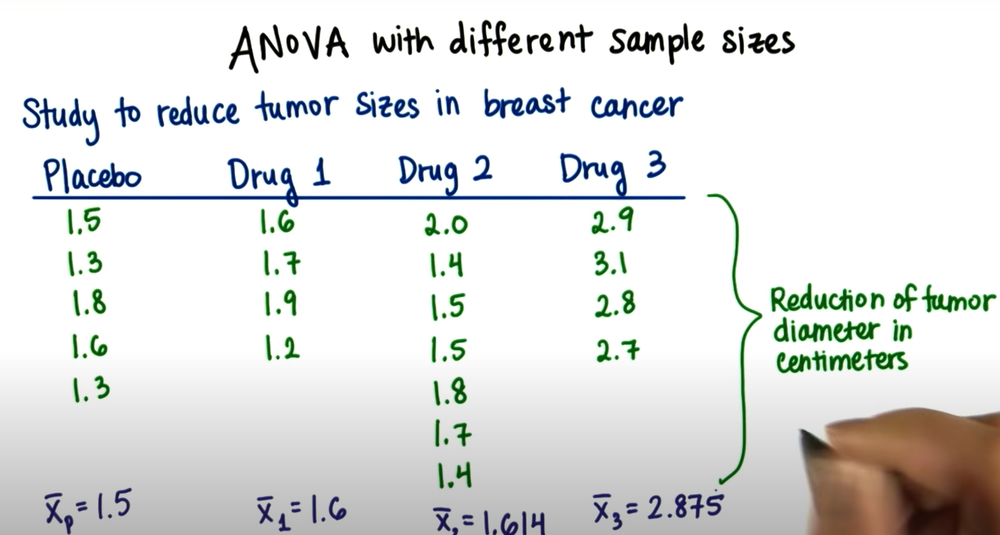

In [36]:
p=np.array([1.5,1.3,1.8,1.6,1.3])
drug1=np.array([1.6,1.7,1.9,1.2])
drug2=np.array([2.0,1.4,1.5,1.5,1.8,1.7,1.4])
drug3=np.array([2.9,3.1,2.8,2.7])

In [37]:
xbarp=sum(p)/len(p)
xbar1=sum(drug1)/len(drug1)
xbar2=sum(drug2)/len(drug2)
xbar3=sum(drug3)/len(drug3)

In [38]:
xbarp=np.round(xbarp, decimals=1)
xbarp

1.5

In [39]:
xbar1=np.round(xbar1, decimals=1)
xbar1

1.6

In [40]:
xbar2=np.round(xbar2, decimals=3)
xbar2

1.614

In [41]:
xbar3=np.round(xbar3, decimals=3)
xbar3

2.875

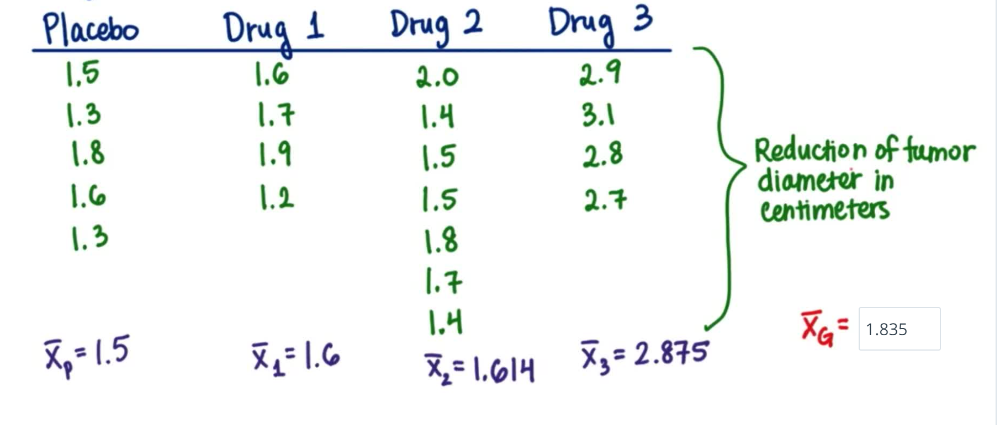

# reshape to the longest size, which is drug2. 
https://stackoverflow.com/questions/7891697/numpy-adding-two-vectors-with-different-sizes

In [42]:
len_sample=(len(p)+len(drug1)+len(drug2)+len(drug3))
len_sample

20

In [43]:
p.resize(drug2.shape)
p

array([1.5, 1.3, 1.8, 1.6, 1.3, 0. , 0. ])

In [44]:
drug1.resize(drug2.shape)
drug1

array([1.6, 1.7, 1.9, 1.2, 0. , 0. , 0. ])

In [45]:
drug3.resize(drug2.shape)
drug3

array([2.9, 3.1, 2.8, 2.7, 0. , 0. , 0. ])

In [46]:
gm=sum(p+drug1+drug2+drug3)/len_sample
gm=np.round(gm,decimals=3)
gm

1.835

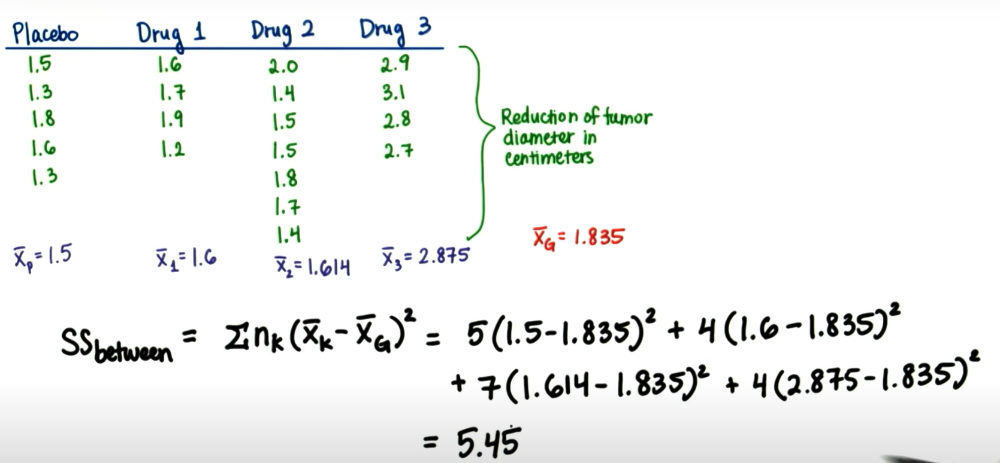

In [63]:
# redefine variables because they were changed when it was reshaping 

p=np.array([1.5,1.3,1.8,1.6,1.3])
drug1=np.array([1.6,1.7,1.9,1.2])
drug2=np.array([2.0,1.4,1.5,1.5,1.8,1.7,1.4])
drug3=np.array([2.9,3.1,2.8,2.7])

In [64]:
# note! within group samples are different!

ssbetween=(((xbarp-gm)**2)*len(p) + ((xbar1-gm)**2)*len(drug1) + ((xbar2-gm)**2)*len(drug2)+ ((xbar3-gm)**2)*len(drug3))
ssbetween 

5.450312

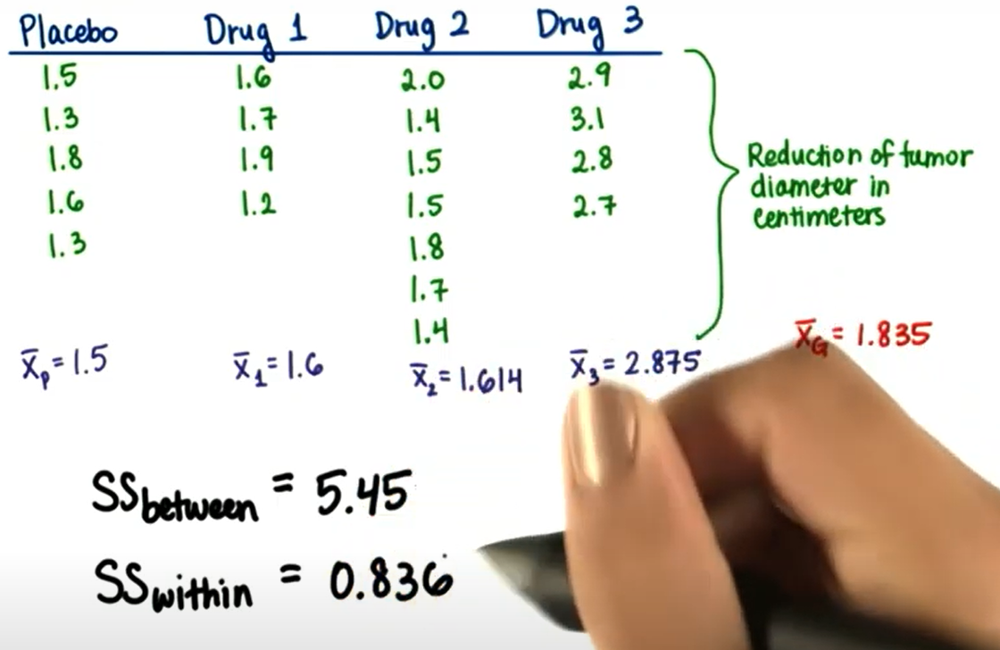

In [70]:
sswithin = sum((p-xbarp)**2) + sum((drug1-xbar1)**2) + sum((drug2-xbar2)**2) + sum((drug3-xbar3)**2)
sswithin

0.836072

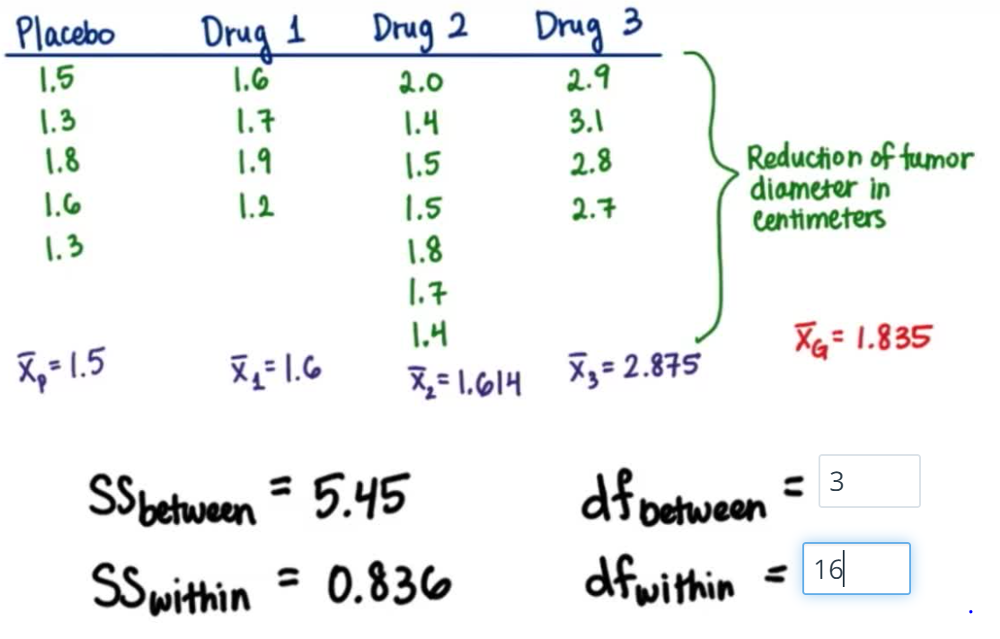

In [71]:
# k-1 :K is the number of population group
dfbetween=4-1
dfbetween

3

In [73]:
# N-k  :N is total sample size
dfwithin =len_sample-4
dfwithin

16

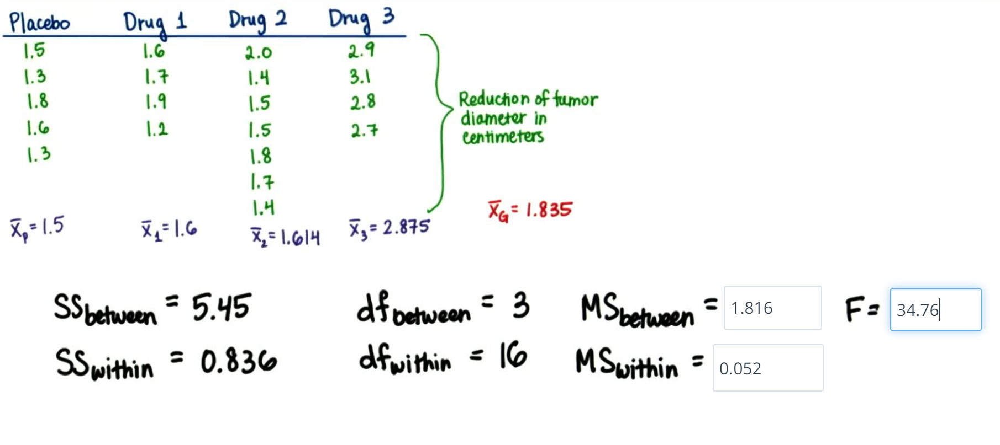

In [74]:
msbetween = ssbetween/dfbetween
msbetween

1.8167706666666668

In [75]:
mswithin = sswithin/dfwithin
mswithin

0.0522545

In [76]:
f_stats=msbetween/mswithin
f_stats

34.76773611204139

In [77]:
ssttl = ssbetween + sswithin
ssttl

6.286384

In [79]:
eta=ssbetween/ssttl
eta

0.8670027157106535

* 87% the difference between tumor reductions can be explained by different treatments.

# Should avoid Type 2 error
* **failing to find treatment affects when they actually exisit.

# How to avoid? Increasing "power" 

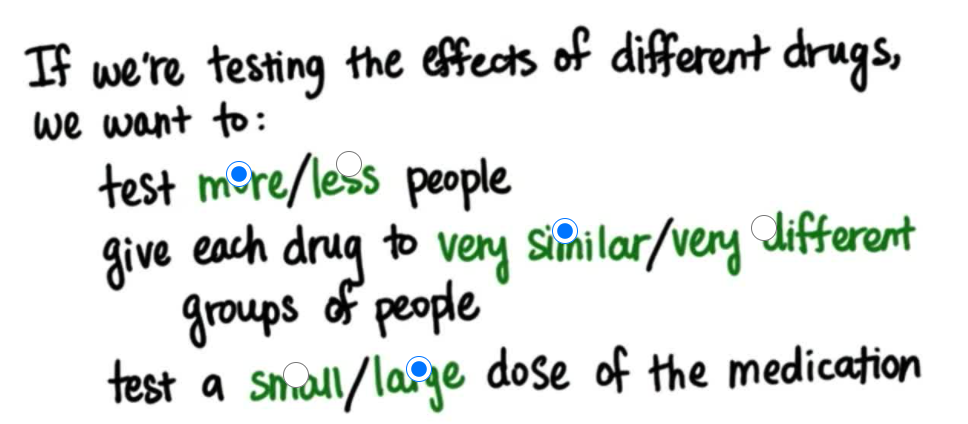

# 1. Larger smaples results in higher power.
* **standard error, if N INCREASES, standard error decreases**
# 2. Lower within-group variability leads to higher power.
* **more sure about significant differences when the distributions are NOT OVERLAPPING.**
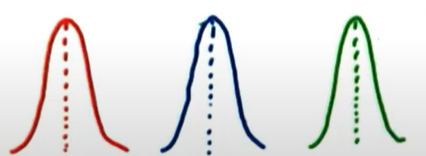

* **however, if the variability increases,harder to tell if there is significant difference.**
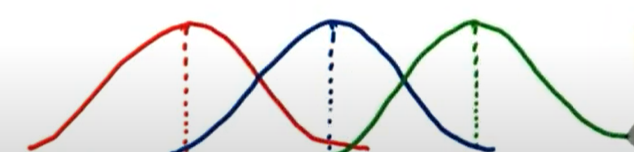

# 3. Choosing treatmenst with strong effect size will increase power.
* **treatement conditions last longer or occur more often.**
